<a href="https://colab.research.google.com/github/ZohebAbai/Deep-Learning-Projects/blob/master/03_TF_Multilabel_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-label Interior Design Image Classification

We are about to classify interior design images which can have multi label associated with it. 

Steps Covered:

1. Custom Dataset -- Web Scraping, Data Cleaning and Uploading to GDrive
2. Import Libraries
3. Downloading and View Dataset
4. Data Preprocessing -- Splitting, Normalization and multi-hot encoding 
5. Data Pipeline: Create TFRecord with Data Augmentation
6. Model Building with Custom Loss
7. Finding Max Learning rate for OneCycle LR
8. Transfer Learning with OneCycleLR policy
9. Performance Profiling
10. Gradio App



## Custom Dataset -- Web Scraping, Data Cleaning and Uploading to GDrive

I scraped data from several Interior design websites and Google Images, and due to copyright policies of those companies I can't share the notebook and data. I used Python libraries for web scraping and create a csv file downloading just the HTML metadata related to images. Having metadata first it becomes easy to clean the unnecessary texts mentioned in each labels (e.g. Website info, designer info etc.). We choose labels within this list of words -- 'Classic', 'Modern', 'Glam', 'Industrial','Traditional', 'Coastal', 'Global', 'Preppy', 'Rustic' 'Transitional', 'Farmhouse', 'Bohemian', 'Midcentury','Scandinavian', 'Eclectic', 'Minimal'. For Image links we remove those links which opens to HTTP error. Finally we remove the images with no associated labels, resize them all to 224x224, zip it and upload to GDrive. 

So on GDrive we have two files:
1. Zipfile containing all images.
2. CSV file with first column having image names and second column having the corresponding labels

## Import Libraries

In [1]:
!pip install -U tensorboard_plugin_profile

     |████████████████████████████████| 1.1 MB 5.0 MB/s 


In [2]:
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 5.2 MB/s 


In [3]:
!pip install -q gradio

     |████████████████████████████████| 871 kB 5.3 MB/s 
     |████████████████████████████████| 210 kB 49.4 MB/s 
     |████████████████████████████████| 2.0 MB 53.2 MB/s 
     |████████████████████████████████| 1.1 MB 41.4 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 52 kB 858 kB/s 
     |████████████████████████████████| 144 kB 37.9 MB/s 
     |████████████████████████████████| 271 kB 39.2 MB/s 
     |████████████████████████████████| 94 kB 3.1 MB/s 
     |████████████████████████████████| 10.9 MB 25.9 MB/s 
     |████████████████████████████████| 58 kB 5.8 MB/s 
     |████████████████████████████████| 79 kB 7.5 MB/s 
     |████████████████████████████████| 856 kB 45.6 MB/s 
     |████████████████████████████████| 61 kB 423 kB/s 
     |████████████████████████████████| 3.6 MB 43.4 MB/s 
     |████████████████████████████████| 58 kB 5.9 MB/s 


In [4]:
import numpy as np
import pandas as pd
import os
import shutil
import time
import tarfile
import random
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
from pathlib import Path
from collections import namedtuple
from datetime import datetime
from typing import List, Callable,Dict, Tuple, Iterator
%matplotlib inline
np.random.seed(101)

# tensorflow imports
import tensorflow as tf
import tensorflow.keras.backend as K
tf.random.set_seed(101)

# tf.keras imports
from tensorflow.keras import Model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, TensorBoard
from tensorflow.keras.models import load_model

# tfa imports
from tensorflow_addons.metrics import F1Score

# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [5]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()
    print("Device:", tpu.master())
    strategy = tf.distribute.TPUStrategy(tpu)
except:
    print("Not connected to a TPU runtime. Using CPU/GPU strategy")
    strategy = tf.distribute.get_strategy()
print("Number of replicas:", strategy.num_replicas_in_sync)

Not connected to a TPU runtime. Using CPU/GPU strategy
Number of replicas: 1


In [6]:
!nvidia-smi

Tue Feb  1 13:27:12 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

The complete code can be run on TPU too, considering the fact that your TFrecords data should be on GCP cloud storage bucket. As we have not planned for pay to learn, so we skip TPU for now. 

## Downloading and View Dataset



In [7]:
# copy the csv file for labels and the dataset folder
data_dir = '/content/data/'

if not os.path.exists(data_dir):
    os.makedirs(data_dir)
    try:
        shutil.copy("/content/drive/MyDrive/Colab Notebooks/Datasets/final_data.csv", "/content/data/data.csv")
        shutil.copy("/content/drive/MyDrive/Colab Notebooks/Datasets/interior_resized_data.tar", "/content/data/")
        print("File downloaded successfully.")
 
    # If source and destination are same
    except:
        print("Error occurred while copying file.")

    # Untar the tar file
    file = tarfile.open('/content/data/interior_resized_data.tar')
    # extracting file
    file.extractall('/content/data/')
    file.close()        
    # Remove the tar file
    os.remove("/content/data/interior_resized_data.tar")

File downloaded successfully.


In [8]:
# View the csv file
path = Path(data_dir)
df = pd.read_csv(path/'data.csv')
df.head()

,images,class
0,img0.jpg,"Classic,Traditional"
1,img1.jpg,"Modern,Glam,Bohemian"
2,img2.jpg,"Modern,Glam,Bohemian"
3,img3.jpg,"Transitional,Farmhouse"
4,img4.jpg,Transitional


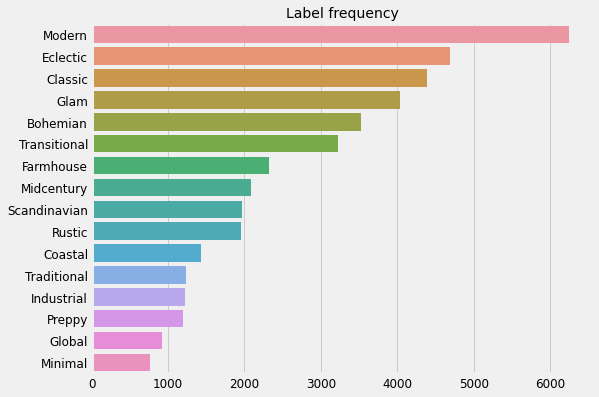

In [9]:
# Get label frequencies in descending order
label_freq = df['class'].apply(lambda s: str(s).split(',')).explode().value_counts().sort_values(ascending=False)

# Bar plot
style.use("fivethirtyeight")
plt.figure(figsize=(8,6))
sns.barplot(y=label_freq.index.values, x=label_freq, order=label_freq.index)
plt.title("Label frequency", fontsize=14)
plt.xlabel("")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [10]:
categories = label_freq.index.values.tolist()
WEIGHTS = label_freq.values.min()/label_freq.values
LBS = len(categories)

In [11]:
IMAGE_SIZE = (224, 224)

def get_image(file, norm=False, enc=False):
    img = tf.io.read_file(file)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, IMAGE_SIZE)
    img = img/255.
    # imagenet stats
    imgnet_mean = [0.485, 0.456, 0.406] 
    imgnet_std = [0.229, 0.224, 0.225]
    if norm:
        img = (img - imgnet_mean) / imgnet_std
    if enc:
        img = tf.cast(img, tf.dtypes.uint8)
        img = tf.io.encode_jpeg(img).numpy()
    return img

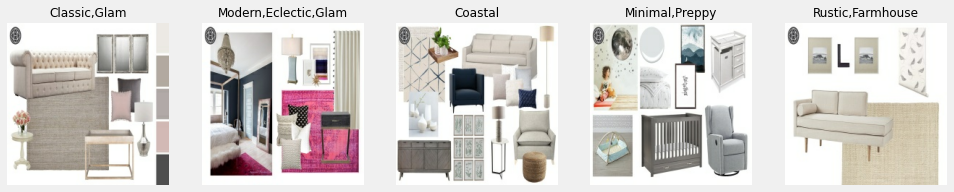

In [12]:
# View a random image
def view_random_image(img_dir):
    # Folder
    fig = plt.figure(figsize=(15,5))
    for i in range(5):
        # Get a random image path
        random_image = random.sample(os.listdir(img_dir), 1)
        filename = img_dir+'/'+random_image[0]
        img = get_image(filename)
        img_class = df[df.images == random_image[0]]['class'].values[0]
        ax=fig.add_subplot(1,5,i+1)
        ax.set_title(img_class, fontsize=12)
        ax.axis("off")
        plt.imshow(img)
    plt.show()

IMG_DIR = 'data/train_images'
view_random_image(IMG_DIR)

## Data Preprocessing -- Splitting, Normalization and multi hot encoding 

There is no one way to sequentially solve this. You can have your own sequence where splitting comes first and then multi-hot encoding, normalization and then data viewing. There is no particularly right way for the sequence.

In [13]:
def get_labels(classes, categories):   
    cate = np.asarray(categories)
    labels = []
    for x in classes:
        label = np.zeros(len(cate), dtype=np.int64)
        xs = x.split(',')
        for i in xs:
            ind = np.where(cate == i)[0][0]
            label[ind] = 1
        labels.append(label)
    return labels

In [14]:
df['labels'] = pd.Series(get_labels(df['class'].values, categories))
df.head()

,images,class,labels
0,img0.jpg,"Classic,Traditional","[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]"
1,img1.jpg,"Modern,Glam,Bohemian","[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
2,img2.jpg,"Modern,Glam,Bohemian","[1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
3,img3.jpg,"Transitional,Farmhouse","[0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
4,img4.jpg,Transitional,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"


In [15]:
def split_dataset(dir, df, frac=0.8):
    X_train, y_train, X_valid, y_valid, X_test = [], [], [], [], []
    dfs = df.sample(frac=1, random_state=101)
    train = dfs[:int(frac*df.shape[0])]
    valid = dfs[int(frac*df.shape[0]):]
    train_arr = dir+'/'+train['images'].values
    valid_arr = dir+'/'+valid['images'].values
    X_train = [get_image(i, enc=True) for i in train_arr]
    X_valid = [get_image(i, enc=True) for i in valid_arr]
    y_train = train.labels.values
    y_valid = valid.labels.values
    return X_train, y_train, X_valid, y_valid

In [16]:
X_train, y_train, X_valid, y_valid = split_dataset(IMG_DIR, df)

In [17]:
len_train, len_valid = len(X_train), len(X_valid)
print(f"""Length of train dataset: {len_train} \nLength of valid dataset: {len_valid}""")

Length of train dataset: 16077 
Length of valid dataset: 4020


## Create TFRecord Dataset

The TFRecord format is a simple format for storing a sequence of binary records. Converting your data into TFRecord has many advantages, such as:

- **More efficient storage**: our origianl dataset is of 9GB Size, while TFRecords data takes just 300MB in total.
- **Fast I/O**: the TFRecord format can be read with parallel I/O operations, which is useful for TPUs or multiple hosts.
- **Self-contained files**: the TFRecord data can be read from a single source -- our original dataset originally stores data in two different formats ("images" and "labels").

An important use case of the TFRecord data format is training on TPUs. First, TPUs are fast enough to benefit from optimized I/O operations. In addition, TPUs require data to be stored remotely (e.g. on Google Cloud Storage) and using the TFRecord format makes it easier to load the data without batch-downloading.

In [18]:
# For float sequence of images
def byte_tffeature(value) -> tf.train.Feature:
    if not isinstance(value, list):
        value = [value]
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=value))

# For int sequence of labels
def int_tffeature(value) -> tf.train.Feature:
    if not isinstance(value, list):
        value = [value]
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

# For returning a dict value sequences with images and their labels
def create_tfexample(x, y=None) -> tf.train.Example:
    if y is None:
        feat_dict = {'image': byte_tffeature(x)}
    else:
        feat_dict = {'image': byte_tffeature(x), 'label': int_tffeature(y.tolist())}
    return tf.train.Example(features=tf.train.Features(feature=feat_dict))

# For serializing the complete dataset into sequences of features and storing it
def create_tfrecord(output_fn, X, y=None, overwrite = False):
    #assert len(X) == len(y) , "Length of features and labels don't match"
    if overwrite or not tf.io.gfile.exists(output_fn):
        with tf.io.TFRecordWriter(output_fn) as record_writer:  
            for i in range(len(X)):
                example = create_tfexample(X[i]) if y is None else create_tfexample(X[i], y[i])
                record_writer.write(example.SerializeToString())
    else:
        print('Output file already exists. Skipping.')

In [19]:
# Create the directories to store the tfrecords data
train_file = os.path.join(data_dir, "train.tfrecord")
valid_file = os.path.join(data_dir, "valid.tfrecord")

# Create TFRecords for train and valid dataset
create_tfrecord(train_file, X_train, y_train)
create_tfrecord(valid_file, X_valid, y_valid)

### Image Augmentation 





In [20]:
# Function for parsing every sequence linearly
def tfexample_parser(tfexample: tf.train.Example) -> Tuple[tf.Tensor, tf.Tensor]:
    feat_dict = {'image': tf.io.FixedLenFeature([], tf.string),
                 'label': tf.io.FixedLenFeature([LBS], tf.int64)}
    feat = tf.io.parse_single_example(tfexample, features=feat_dict)
    x, y = feat['image'], feat['label']
    x = tf.image.decode_image(x, channels=3)
    x = tf.cast(x, tf.float32)
    x = tf.reshape(x, [*IMAGE_SIZE, 3])
    y = tf.cast(y, tf.int32)
    return x, y

In [21]:
# Create some additional training images by randomly flipping and
# increasing/decreasing the saturation of images in the training set. 
def data_augment(x, y):
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_contrast(x, 0, 0.2)
    x = tf.image.random_brightness(x, 0.2)
    return x, y

### Input Data Pipeline

* Extract: Read data from persistent storage
* Transform: Use CPU cores to parse and perform preprocessing operations on the data
* Load: Load the transformed data onto GPU for executing ML model

In [22]:
def tfrecord_ds(file_pattern: str, parser, augmenter = data_augment, batch_size: int = 32, training: bool = False) -> tf.data.Dataset:
    ignore_order = tf.data.Options()
    auto = tf.data.AUTOTUNE
    ignore_order.experimental_deterministic = False
    
    # Data extraction
    files = tf.data.TFRecordDataset(file_pattern, num_parallel_reads=auto)
    files = files.with_options(ignore_order) # for speed
    # Parallelized Data Extraction
    dataset = files.map(parser, num_parallel_calls=auto)
    # For training data, augment, randomize the order of sequences
    if training:
        dataset = dataset.map(augmenter, num_parallel_calls=auto)
        dataset = dataset.cache()
        dataset = dataset.shuffle(2048)
    dataset = dataset.batch(batch_size=batch_size, drop_remainder=True)
    # Pipelining the data to decrease idle time
    dataset = dataset.prefetch(auto)
    return dataset

In [23]:
def get_hparams(**kwargs):
    return namedtuple('GenericDict', kwargs.keys())(**kwargs)

hparams = get_hparams(
    batch_size= 512 * strategy.num_replicas_in_sync,  # training batch size
    epochs= 20,  # number of epochs to train
    )

In [24]:
train_dataset = tfrecord_ds(train_file, tfexample_parser, data_augment, batch_size= hparams.batch_size, training=True)
valid_dataset = tfrecord_ds(valid_file, tfexample_parser, batch_size=hparams.batch_size, training=False)

## Model Building with custom Loss

### Custom Loss: Weighted F1 Loss as TF doesn't have loss function for our metric F1score



In [25]:
@tf.function
def weighted_f1_loss(y, y_hat):
    """Compute the macro soft F1-score as a cost (average 1 - soft-F1 across all labels).
    Use probability values instead of binary predictions.
    
    Args:
        y (int32 Tensor): targets array of shape (BATCH_SIZE, N_LABELS)
        y_hat (float32 Tensor): probability matrix from forward propagation of shape (BATCH_SIZE, N_LABELS)
        
    Returns:
        cost (scalar Tensor): value of the cost function for the batch
    """
    y = tf.cast(y, tf.float32)
    y_hat = tf.cast(y_hat, tf.float32)
    tp = tf.reduce_sum(y_hat * y, axis=0)
    fp = tf.reduce_sum(y_hat * (1 - y), axis=0)
    fn = tf.reduce_sum((1 - y_hat) * y, axis=0)
    soft_f1 = 2*tp / (2*tp + fn + fp + 1e-16)
    cost = 1 - soft_f1 # reduce 1 - soft-f1 in order to increase soft-f1
    macro_cost = tf.reduce_mean(WEIGHTS*cost) # average on all labels
    return macro_cost

### Model Building with EfficientNet

In [26]:
#Define model
def build_model(num_classes):
    inputs = Input(shape=(*IMAGE_SIZE, 3))
    model = EfficientNetB0(include_top=False, input_tensor=inputs, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = GlobalAveragePooling2D(name="avg_pool")(model.output)
    #x = Dropout(0.2)(x)
    #x = Dense(256, activation='relu', name='hidden_layer_last')(x)
    outputs = Dense(num_classes, activation="sigmoid", name="pred")(x)

    # Compile
    model = Model(inputs, outputs, name="EfficientNet")
    model.compile(
        optimizer="sgd", loss=weighted_f1_loss, 
        metrics=[F1Score(num_classes=16, average='weighted', threshold=0.5)]
    )
    return model

with strategy.scope():
    model = build_model(num_classes=LBS)

model.summary()

16719872/16705208 [==============================] - 0s 0us/step
Model: "EfficientNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPa

## Finding Max Learning rate for OneCycle LR

In [27]:
class LRFinder(Callback):
    """`Callback` that exponentially adjusts the learning rate after each training batch between `start_lr` and
    `end_lr` for a maximum number of batches: `max_step`. The loss and learning rate are recorded at each step allowing
    visually finding a good learning rate as per https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html via
    the `plot` method.
    """

    def __init__(self, start_lr: float = 1e-7, end_lr: float = 10, max_steps: int = 10, smoothing=0.9):
        super(LRFinder, self).__init__()
        self.start_lr, self.end_lr = start_lr, end_lr
        self.max_steps = max_steps
        self.smoothing = smoothing
        self.step, self.best_loss, self.avg_loss, self.lr = 0, 0, 0, 0
        self.lrs, self.losses = [], []

    def on_train_begin(self, logs=None):
        self.step, self.best_loss, self.avg_loss, self.lr = 0, 0, 0, 0
        self.lrs, self.losses = [], []
    
    def on_train_batch_begin(self, batch, logs=None):
        self.lr = self.exp_annealing(self.step)
        tf.keras.backend.set_value(self.model.optimizer.lr, self.lr)
    
    def on_train_batch_end(self, batch, logs=None):
        logs = logs or {}
        loss = logs.get('loss')
        step = self.step
        if loss:
            self.avg_loss = self.smoothing * self.avg_loss + (1 - self.smoothing) * loss
            smooth_loss = self.avg_loss / (1 - self.smoothing ** (self.step + 1))
            self.losses.append(smooth_loss)
            self.lrs.append(self.lr)

            if step == 0 or loss < self.best_loss:
                self.best_loss = loss

            if smooth_loss > 4 * self.best_loss or tf.math.is_nan(smooth_loss):
                self.model.stop_training = True

        if step == self.max_steps:
            self.model.stop_training = True

        self.step += 1

    def exp_annealing(self, step):
        return self.start_lr * (self.end_lr / self.start_lr) ** (step * 1. / self.max_steps)

    def plot(self):
        fig, ax = plt.subplots(1, 1)
        ax.set_ylabel('Loss')
        ax.set_xlabel('Learning Rate (log scale)')
        ax.set_xscale('log')
        ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.0e'))
        ax.plot(self.lrs, self.losses)

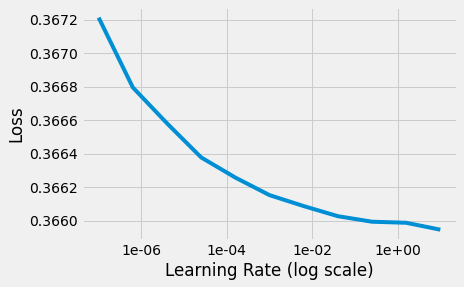

In [28]:
lr_finder = LRFinder()
model.fit(train_dataset, epochs=1, callbacks=[lr_finder], verbose=False)
lr_finder.plot()

## Transfer Learning with OneCycleLR policy


In [29]:
class CosineAnnealer:
    
    def __init__(self, start, end, steps):
        self.start = start
        self.end = end
        self.steps = steps
        self.n = 0
        
    def step(self):
        self.n += 1
        cos = np.cos(np.pi * (self.n / self.steps)) + 1
        return self.end + (self.start - self.end) / 2. * cos


class OneCycleScheduler(Callback):
    """`Callback` that schedules the learning rate on a 1cycle policy as per Leslie Smith's paper(https://arxiv.org/pdf/1803.09820.pdf).
    If the model supports a momentum parameter, it will also be adapted by the schedule.
    The implementation adopts additional improvements as per the fastai library: https://docs.fast.ai/callbacks.one_cycle.html, where
    only two phases are used and the adaptation is done using cosine annealing.
    In phase 1 the LR increases from `lr_max / div_factor` to `lr_max` and momentum decreases from `mom_max` to `mom_min`.
    In the second phase the LR decreases from `lr_max` to `lr_max / (div_factor * 1e4)` and momemtum from `mom_max` to `mom_min`.
    By default the phases are not of equal length, with the phase 1 percentage controlled by the parameter `phase_1_pct`.
    """

    def __init__(self, lr_max, steps, mom_min=0.85, mom_max=0.95, phase_1_pct=0.3, div_factor=10.):
        super(OneCycleScheduler, self).__init__()
        lr_min = lr_max / div_factor
        final_lr = lr_max / (div_factor * 1e4)
        phase_1_steps = steps * phase_1_pct
        phase_2_steps = steps - phase_1_steps
        
        self.phase_1_steps = phase_1_steps
        self.phase_2_steps = phase_2_steps
        self.phase = 0
        self.step = 0
        
        self.phases = [[CosineAnnealer(lr_min, lr_max, phase_1_steps), CosineAnnealer(mom_max, mom_min, phase_1_steps)], 
                 [CosineAnnealer(lr_max, final_lr, phase_2_steps), CosineAnnealer(mom_min, mom_max, phase_2_steps)]]
        
        self.lrs = []
        self.moms = []
    
    def on_train_begin(self, logs=None):
        self.phase = 0
        self.step = 0

        self.set_lr(self.lr_schedule().start)
        self.set_momentum(self.mom_schedule().start)
        
    def on_train_batch_begin(self, batch, logs=None):
        self.lrs.append(self.get_lr())
        self.moms.append(self.get_momentum())

    def on_train_batch_end(self, batch, logs=None):
        self.step += 1
        if self.step >= self.phase_1_steps:
            self.phase = 1
            
        self.set_lr(self.lr_schedule().step())
        self.set_momentum(self.mom_schedule().step())
        
    def get_lr(self):
        try:
            return tf.keras.backend.get_value(self.model.optimizer.lr)
        except AttributeError:
            return None
        
    def get_momentum(self):
        try:
            return tf.keras.backend.get_value(self.model.optimizer.momentum)
        except AttributeError:
            return None
        
    def set_lr(self, lr):
        try:
            tf.keras.backend.set_value(self.model.optimizer.lr, lr)
        except AttributeError:
            pass # ignore
        
    def set_momentum(self, mom):
        try:
            tf.keras.backend.set_value(self.model.optimizer.momentum, mom)
        except AttributeError:
            pass # ignore

    def lr_schedule(self):
        return self.phases[self.phase][0]
    
    def mom_schedule(self):
        return self.phases[self.phase][1]
    
    def plot(self):
        ax = plt.subplot(1, 2, 1)
        ax.plot(self.lrs)
        ax.set_title('Learning Rate')
        ax = plt.subplot(1, 2, 2)
        ax.plot(self.moms)
        ax.set_title('Momentum')

In [30]:
# train the model
start = time.time()

#checkpointer
checkpointer = ModelCheckpoint(filepath="bestmodel.h5", verbose=0, 
                               save_best_only=True, monitor="val_f1_score")
# one cycle lr
max_lr=1e-01
steps = np.ceil(len_train / hparams.batch_size) * hparams.epochs
lr_scheduler = OneCycleScheduler(max_lr, steps)

# Create a TensorBoard callback
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tboard_callback = TensorBoard(log_dir = logs, histogram_freq = 1, profile_batch = '30,40')

# Fit the model
history = model.fit(train_dataset, 
                  epochs = hparams.epochs, 
                  validation_data=valid_dataset,
                  callbacks = [lr_scheduler, checkpointer, tboard_callback])
end = time.time()
print ("Model took %0.2f seconds to train"%(end - start))

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/20
      6/Unknown - 4s 503ms/step - loss: 0.3654 - f1_score: 0.2015WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0862s vs `on_train_batch_end` time: 0.4442s). Check your callbacks.
31/31 [==============================] - 27s 837ms/step - loss: 0.3649 - f1_score: 0.1990 - val_loss: 0.3650 - val_f1_score: 0.1639
Epoch 2/20
31/31 [==============================] - 25s 812ms/step - loss: 0.3649 - f1_score: 0.2040 - val_loss: 0.3650 - val_f1_score: 0.1639
Epoch 3/20
31/31 [==============================] - 22s 701ms/step - loss: 0.3648 - f1_score: 0.2037 - val_loss: 0.3650 - val_f1_score: 0.1639
Epoch 4/20
31/31 [==============================] - 21s 687ms/step - loss: 0.3648 - f1_score: 0.2155 - val_loss: 0.3649 - val_f1_score: 0.1649
Epoch 5/20
31/31 [==============================] - 22s 699ms/step - loss: 0.3647 - f1_score: 0.2325 - val_loss: 0.3649 - val_f1_score: 0.1818
Epoch 6/20
31/31 [============================

### Unfreezing the model and retraining

In [31]:
def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = True

    model.compile(
        optimizer="sgd", loss=weighted_f1_loss, 
        metrics=[F1Score(num_classes=16, average='weighted', threshold=0.5)]
    )

unfreeze_model(model)

In [32]:
# train the model
start = time.time()

#checkpointer
checkpointer = ModelCheckpoint(filepath="bestmodel.h5", verbose=0, 
                               save_best_only=True, monitor="val_f1_score")
# one cycle lr
max_lr=1e-01
steps = np.ceil(len_train / hparams.batch_size) * hparams.epochs
lr_scheduler = OneCycleScheduler(max_lr, steps)

# Create a TensorBoard callback
logs = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tboard_callback = TensorBoard(log_dir = logs, histogram_freq = 1, profile_batch = '30,40')

# Fit the model
history = model.fit(train_dataset, 
                  epochs = hparams.epochs, 
                  validation_data=valid_dataset,
                  callbacks = [lr_scheduler, checkpointer, tboard_callback])
end = time.time()
print ("Model took %0.2f seconds to train"%(end - start))

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/20
      6/Unknown - 12s 544ms/step - loss: 0.3650 - f1_score: 0.2697WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0705s vs `on_train_batch_end` time: 0.4226s). Check your callbacks.
31/31 [==============================] - 34s 823ms/step - loss: 0.3643 - f1_score: 0.2683 - val_loss: 0.3645 - val_f1_score: 0.2485
Epoch 2/20
31/31 [==============================] - 26s 851ms/step - loss: 0.3642 - f1_score: 0.2677 - val_loss: 0.3644 - val_f1_score: 0.2514
Epoch 3/20
31/31 [==============================] - 23s 734ms/step - loss: 0.3641 - f1_score: 0.2716 - val_loss: 0.3643 - val_f1_score: 0.2532
Epoch 4/20
31/31 [==============================] - 23s 735ms/step - loss: 0.3641 - f1_score: 0.2745 - val_loss: 0.3641 - val_f1_score: 0.2532
Epoch 5/20
31/31 [==============================] - 23s 733ms/step - loss: 0.3639 - f1_score: 0.2770 - val_loss: 0.3639 - val_f1_score: 0.2553
Epoch 6/20
31/31 [===========================

## Performance Profiling

In [33]:
# Launch TensorBoard and navigate to the Profile tab to view performance profile
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

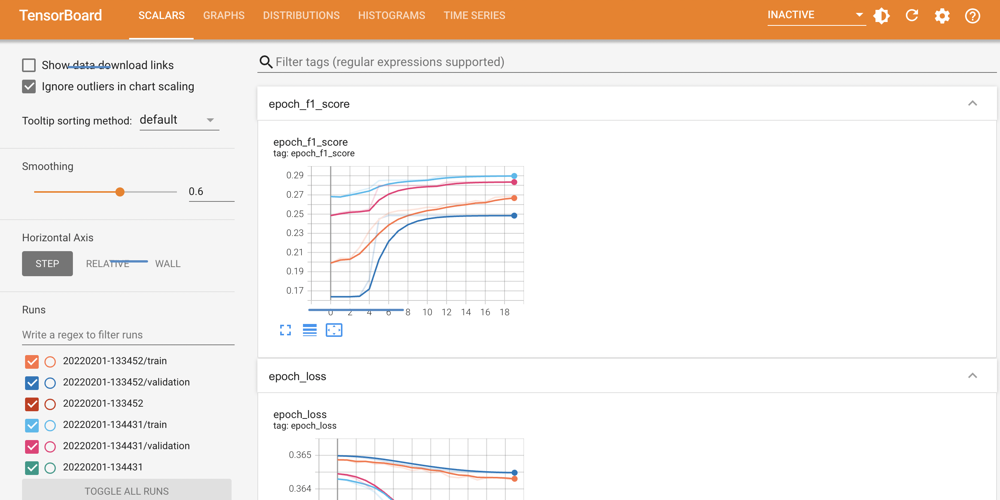

## Gradio App

In [57]:
def classify_image(img):
    img = tf.image.resize(img, IMAGE_SIZE)
    img = img/255.
    img = tf.cast(img, tf.float32)
    img = tf.expand_dims(img, axis=0)
    # load the model
    bestmodel = load_model("bestmodel.h5", custom_objects={'weighted_f1_loss': weighted_f1_loss})
    predictions = bestmodel.predict(img)
    print(predictions)
    for preds in predictions:
        preds[preds > 0.5] = 1 
        preds[preds <= 0.5] = 0
        ind = np.where(preds == 1.)[0]
    pred_labels_list = [''+categories[i] for i in ind]
    pred_labels = ', '.join(pred_labels_list)
    return f"""Labels: {pred_labels}"""

In [58]:
import gradio as gr
face = gr.Interface(fn=classify_image, 
                    inputs=[gr.inputs.Image(shape=(224, 224))],
                    title = "Interior Design Classifier App",
                    description = "Here you can label types of Interior Design Images",
                    outputs=["text"])
face.launch(debug=False)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://43490.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7fd8f3489450>,
 'http://127.0.0.1:7861/',
 'https://43490.gradio.app')

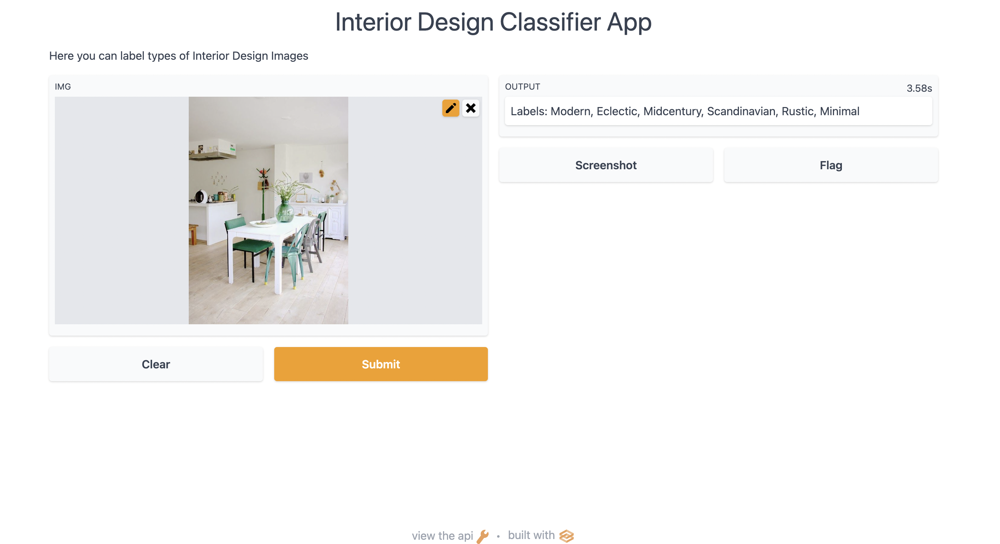